# Capstone Project

## PGDP - ML : 18/19 batch

### Members

Mr. Karan Mitra
Mr. Prabhakaran
Mr. Devanandh

### Mentor

Ms. Sulekha Aloorravi

## Problem Definition

A house value is simply more than location and square footage. Like the features that make up a person, an educated party would want to know all aspects that give a house its value. For example, you want to sell a house and you don’t know the price which you can take — it can’t be too low or too high. To find house price you usually try to find similar properties in your neighbourhood and based on gathered data you will try to assess your house price. 

### Objective 

Take advantage of all of the feature variables available below, use it to analyse and predict house prices. 

1.	cid: a notation for a house
2.	dayhours: Date house was sold
3.	room_bed: Number of Bedrooms/House
4.	room_bath: Number of bathrooms/bedrooms
5.	living_measure: square footage of the home
6.	lot_measure: quare footage of the lot
7.	ceil: Total floors (levels) in house
8.	coast: House which has a view to a waterfront
9.	sight: Has been viewed
10.	condition: How good the condition is (Overall)
11.	quality: grade given to the housing unit, based on grading system
12.	ceil_measure: square footage of house apart from basement
13.	basement_measure: square footage of the basement
14.	yr_built: Built Year
15.	yr_renovated: Year when house was renovated
16.	zipcode: zip
17.	lat: Latitude coordinate
18.	long: Longitude coordinate
19.	living_measure15: Living room area in 2015(implies-- some renovations) This might or might not have affected the lotsize area
20.	lot_measure15: lotSize area in 2015(implies-- some renovations)
21.	furnished: Based on the quality of room 23: total_area: Measure of both living and lot

### Target Variable

price: Price is prediction target


In [1]:
!pip install plotly

distributed 1.21.8 requires msgpack, which is not installed.
You are using pip version 10.0.1, however version 19.0.3 is available.
You should consider upgrading via the 'python -m pip install --upgrade pip' command.


In [2]:
#Basic libraries import

%matplotlib inline
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import plotly.plotly as py
import plotly.graph_objs as go
%matplotlib inline
import plotly
from plotly import __version__
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

print (__version__) # requires version >= 1.9.0
init_notebook_mode(connected=True)

import warnings
warnings.filterwarnings("ignore")

3.6.1


In [3]:
# Importing dataset

house_df = pd.read_csv('innercity.csv')

# EDA and Pre-processing (Feature Engineering and Selection)

In [4]:
house_df.head(10)

,cid,dayhours,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,...,basement,yr_built,yr_renovated,zipcode,lat,long,living_measure15,lot_measure15,furnished,total_area
0,3034200666,20141107T000000,808100,4,3.25,3020,13457,1.0,0,0,...,0,1956,0,98133,47.7174,-122.336,2120,7553,1,16477
1,8731981640,20141204T000000,277500,4,2.50,2550,7500,1.0,0,0,...,800,1976,0,98023,47.3165,-122.386,2260,8800,0,10050
2,5104530220,20150420T000000,404000,3,2.50,2370,4324,2.0,0,0,...,0,2006,0,98038,47.3515,-121.999,2370,4348,0,6694
3,6145600285,20140529T000000,300000,2,1.00,820,3844,1.0,0,0,...,0,1916,0,98133,47.7049,-122.349,1520,3844,0,4664
4,8924100111,20150424T000000,699000,2,1.50,1400,4050,1.0,0,0,...,0,1954,0,98115,47.6768,-122.269,1900,5940,0,5450
5,5525400430,20140715T000000,585000,3,2.50,2050,11690,2.0,0,0,...,0,1989,0,98059,47.5279,-122.161,2410,10172,1,13740
6,2419600075,20141201T000000,465000,3,1.75,1480,6360,1.0,0,0,...,0,1954,0,98133,47.7311,-122.353,1480,6360,0,7840
7,114101161,20140829T000000,480000,3,1.50,2100,67269,1.0,0,0,...,880,1949,0,98028,47.7592,-122.230,1610,15999,0,69369
8,7011201550,20140707T000000,780000,4,2.00,2600,4800,1.0,0,2,...,1200,1953,0,98119,47.6370,-122.371,2050,3505,0,7400
9,7203000640,20140918T000000,215000,4,1.00,1130,7400,1.0,0,0,...,0,1969,0,98003,47.3437,-122.316,1540,7379,0,8530


In [5]:
house_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 23 columns):
cid                 21613 non-null int64
dayhours            21613 non-null object
price               21613 non-null int64
room_bed            21613 non-null int64
room_bath           21613 non-null float64
living_measure      21613 non-null int64
lot_measure         21613 non-null int64
ceil                21613 non-null float64
coast               21613 non-null int64
sight               21613 non-null int64
condition           21613 non-null int64
quality             21613 non-null int64
ceil_measure        21613 non-null int64
basement            21613 non-null int64
yr_built            21613 non-null int64
yr_renovated        21613 non-null int64
zipcode             21613 non-null int64
lat                 21613 non-null float64
long                21613 non-null float64
living_measure15    21613 non-null int64
lot_measure15       21613 non-null int64
furnished           2

There are a total of 21613 data points. 

The input variables are all either integer or float datatype. 

The target variable(price) is of the datatype integer. 

Hence, we would look into regression based models to evaluate the integer target varible.

The "dayhours" column is of object type. Let's eyeball the data.



In [6]:
house_df['dayhours'].head(5)

0    20141107T000000
1    20141204T000000
2    20150420T000000
3    20140529T000000
4    20150424T000000
Name: dayhours, dtype: object

The first 4digits quanitfy the year, the next 2 digits the month and the next 2 digits the date and the last 7 digits probably the time stamp. Hence, splitting this variable into respective variable groups

## 'Dayhours' data manipulation

In [7]:
house_df_new=house_df.copy()

In [8]:
# creating a new column to mimic the timeframe
house_df_new['sold_date_full']=house_df_new['dayhours'].str[:8].astype('int64')

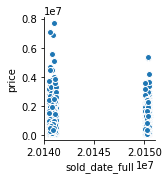

In [9]:
sns.pairplot(house_df_new,x_vars='sold_date_full',y_vars='price')

There are clusters forming up in the time series. Hence, let's split them up into indivdual features - date, month and year

In [10]:
house_df_new['sold_year']=house_df_new['dayhours'].str[:4].astype('int64')
house_df_new['sold_month']=house_df_new['dayhours'].str[4:6].astype('int64')
house_df_new['sold_date']=house_df_new['dayhours'].str[6:8].astype('int64')

In [11]:
house_df_new['sold_year'].head(5)

0    2014
1    2014
2    2015
3    2014
4    2015
Name: sold_year, dtype: int64

In [12]:
house_df_new['sold_month'].head(5)

0    11
1    12
2     4
3     5
4     4
Name: sold_month, dtype: int64

In [13]:
house_df_new['sold_date'].head(5)

0     7
1     4
2    20
3    29
4    24
Name: sold_date, dtype: int64

In [14]:
# having split the dayhours data, dropping the dayhours column from the dataframe

house_df_new=house_df_new.drop('dayhours',axis=1)

In [15]:
house_df_new.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 26 columns):
cid                 21613 non-null int64
price               21613 non-null int64
room_bed            21613 non-null int64
room_bath           21613 non-null float64
living_measure      21613 non-null int64
lot_measure         21613 non-null int64
ceil                21613 non-null float64
coast               21613 non-null int64
sight               21613 non-null int64
condition           21613 non-null int64
quality             21613 non-null int64
ceil_measure        21613 non-null int64
basement            21613 non-null int64
yr_built            21613 non-null int64
yr_renovated        21613 non-null int64
zipcode             21613 non-null int64
lat                 21613 non-null float64
long                21613 non-null float64
living_measure15    21613 non-null int64
lot_measure15       21613 non-null int64
furnished           21613 non-null int64
total_area          21

In [16]:
house_df_new.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
cid,21613.0,4.580302e+09,2.876566e+09,1.000102e+06,2.123049e+09,3.904930e+09,7.308900e+09,9.900000e+09
price,21613.0,5.401822e+05,3.673622e+05,7.500000e+04,3.219500e+05,4.500000e+05,6.450000e+05,7.700000e+06
room_bed,21613.0,3.370842e+00,9.300618e-01,0.000000e+00,3.000000e+00,3.000000e+00,4.000000e+00,3.300000e+01
room_bath,21613.0,2.114757e+00,7.701632e-01,0.000000e+00,1.750000e+00,2.250000e+00,2.500000e+00,8.000000e+00
living_measure,21613.0,2.079900e+03,9.184409e+02,2.900000e+02,1.427000e+03,1.910000e+03,2.550000e+03,1.354000e+04
lot_measure,21613.0,1.510697e+04,4.142051e+04,5.200000e+02,5.040000e+03,7.618000e+03,1.068800e+04,1.651359e+06
ceil,21613.0,1.494309e+00,5.399889e-01,1.000000e+00,1.000000e+00,1.500000e+00,2.000000e+00,3.500000e+00
coast,21613.0,7.541757e-03,8.651720e-02,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00
sight,21613.0,2.343034e-01,7.663176e-01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,4.000000e+00
condition,21613.0,3.409430e+00,6.507430e-01,1.000000e+00,3.000000e+00,3.000000e+00,4.000000e+00,5.000000e+00


# Checking for missing values

In [17]:
house_df_new.isna().sum(axis=0)

cid                 0
price               0
room_bed            0
room_bath           0
living_measure      0
lot_measure         0
ceil                0
coast               0
sight               0
condition           0
quality             0
ceil_measure        0
basement            0
yr_built            0
yr_renovated        0
zipcode             0
lat                 0
long                0
living_measure15    0
lot_measure15       0
furnished           0
total_area          0
sold_date_full      0
sold_year           0
sold_month          0
sold_date           0
dtype: int64

There are no missing values in the dataset.

# Deliverable -1 (Exploratory data quality report reflecting the following)


# 1. Univariate analysis

Univariate analysis – data types and description of the independent attributes which should include (name, meaning, range of values observed, central values (mean and median), standard deviation and quartiles, analysis of the body of distributions / tails, missing values, outliers

In [18]:
# bird's eye view of the numerical distribution of the dataframe

house_df_new.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
cid,21613.0,4.580302e+09,2.876566e+09,1.000102e+06,2.123049e+09,3.904930e+09,7.308900e+09,9.900000e+09
price,21613.0,5.401822e+05,3.673622e+05,7.500000e+04,3.219500e+05,4.500000e+05,6.450000e+05,7.700000e+06
room_bed,21613.0,3.370842e+00,9.300618e-01,0.000000e+00,3.000000e+00,3.000000e+00,4.000000e+00,3.300000e+01
room_bath,21613.0,2.114757e+00,7.701632e-01,0.000000e+00,1.750000e+00,2.250000e+00,2.500000e+00,8.000000e+00
living_measure,21613.0,2.079900e+03,9.184409e+02,2.900000e+02,1.427000e+03,1.910000e+03,2.550000e+03,1.354000e+04
lot_measure,21613.0,1.510697e+04,4.142051e+04,5.200000e+02,5.040000e+03,7.618000e+03,1.068800e+04,1.651359e+06
ceil,21613.0,1.494309e+00,5.399889e-01,1.000000e+00,1.000000e+00,1.500000e+00,2.000000e+00,3.500000e+00
coast,21613.0,7.541757e-03,8.651720e-02,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00
sight,21613.0,2.343034e-01,7.663176e-01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,4.000000e+00
condition,21613.0,3.409430e+00,6.507430e-01,1.000000e+00,3.000000e+00,3.000000e+00,4.000000e+00,5.000000e+00


# Check the input variable distribution and oultiers

## Variable: CID -> A notation for the house

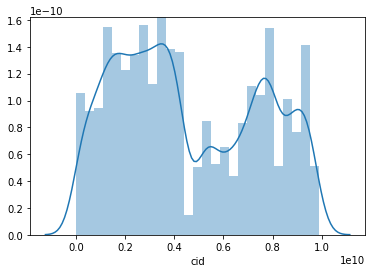

In [19]:
# Verifying the distribution and histogram of the variable

sns.distplot(house_df_new['cid'])


### Inference of distribution

There are two distinct distribution peaks in the column. Though this variable is used just as an identification variable, the histogram shows there are repeat/duplicate entries

In [20]:
# creation of a copy dataframe to evaluate the duplicates

house_df_f=house_df_new.copy()

# duplicate entry extraction

house_df_f['cid_id']=house_df_new['cid'].duplicated()

In [21]:
# size of the duplicate dataframe

house_df_f.loc[house_df_f['cid_id'] == True].shape

(177, 27)

There are a total of 177 duplicate entries in the dataframe. Let's look into the nature of the duplicates and check if they are really duplicates

In [22]:
# Listing the top 5 duplicate entries

house_df_f.loc[house_df_f['cid_id'] == True].sort_values(by='cid').head(5)

,cid,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,condition,...,long,living_measure15,lot_measure15,furnished,total_area,sold_date_full,sold_year,sold_month,sold_date,cid_id
17038,1000102,280000,6,3.00,2400,9373,2.0,0,0,3,...,-122.214,2060,7316,0,11773,20140916,2014,9,16,True
19995,7200179,150000,2,1.00,840,12750,1.0,0,0,3,...,-122.211,1480,6969,0,13590,20141016,2014,10,16,True
17161,109200390,245000,3,1.75,1480,3900,1.0,0,0,4,...,-122.367,1830,6956,0,5380,20140820,2014,8,20,True
12964,123039336,148000,1,1.00,620,8261,1.0,0,0,3,...,-122.364,1180,8244,0,8881,20140611,2014,6,11,True
8544,251300110,225000,3,2.25,2510,12013,2.0,0,0,3,...,-122.314,1870,8017,0,14523,20140731,2014,7,31,True


In [23]:
# returning all instances of the first 5 duplicate entries

house_df_f.loc[house_df_f['cid'].isin(['1000102','7200179','109200390','123039336','251300110'])].sort_values(by='cid')

,cid,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,condition,...,long,living_measure15,lot_measure15,furnished,total_area,sold_date_full,sold_year,sold_month,sold_date,cid_id
3405,1000102,300000,6,3.00,2400,9373,2.0,0,0,3,...,-122.214,2060,7316,0,11773,20150422,2015,4,22,False
17038,1000102,280000,6,3.00,2400,9373,2.0,0,0,3,...,-122.214,2060,7316,0,11773,20140916,2014,9,16,True
3874,7200179,175000,2,1.00,840,12750,1.0,0,0,3,...,-122.211,1480,6969,0,13590,20150424,2015,4,24,False
19995,7200179,150000,2,1.00,840,12750,1.0,0,0,3,...,-122.211,1480,6969,0,13590,20141016,2014,10,16,True
1727,109200390,250000,3,1.75,1480,3900,1.0,0,0,4,...,-122.367,1830,6956,0,5380,20141020,2014,10,20,False
17161,109200390,245000,3,1.75,1480,3900,1.0,0,0,4,...,-122.367,1830,6956,0,5380,20140820,2014,8,20,True
8438,123039336,244900,1,1.00,620,8261,1.0,0,0,3,...,-122.364,1180,8244,0,8881,20141208,2014,12,8,False
12964,123039336,148000,1,1.00,620,8261,1.0,0,0,3,...,-122.364,1180,8244,0,8881,20140611,2014,6,11,True
5441,251300110,358000,3,2.25,2510,12013,2.0,0,0,3,...,-122.314,1870,8017,0,14523,20150114,2015,1,14,False
8544,251300110,225000,3,2.25,2510,12013,2.0,0,0,3,...,-122.314,1870,8017,0,14523,20140731,2014,7,31,True


### Inference of duplicates:

There are certain repeated entries indicating the same property has been bought and resold, since there is no change in the other parameters. Hence, we are retaining them in the dataframe.

In [24]:
!pip install plotly

distributed 1.21.8 requires msgpack, which is not installed.
You are using pip version 10.0.1, however version 19.0.3 is available.
You should consider upgrading via the 'python -m pip install --upgrade pip' command.


In [25]:
%matplotlib inline
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import plotly.plotly as py
import plotly.graph_objs as go
%matplotlib inline
import plotly
from plotly import __version__
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

print (__version__) # requires version >= 1.9.0
init_notebook_mode(connected=True)

import warnings
warnings.filterwarnings("ignore")

3.6.1


In [26]:
# Plotting boxplot to detect outliers

data=[(go.Box(x=house_df_new['cid'],name='House property identifier',showlegend=True))]
plotly.offline.iplot(data)


### Inference of outliers

No outliers present in this variable. 

Note: This is an identification variable only, this variable can be dropped for regression analysis.

## Variable room_bed -> No. of bedrooms/home

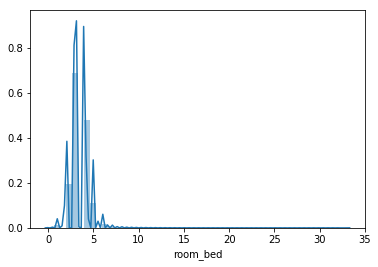

In [27]:
# Verifying the distribution of the variable

sns.distplot(house_df_new['room_bed'])
plt.show()

### Inference of distribution

The data is right skewed indicating outliers, and also there are distinct peaks indicating clusters present in the dataframe

In [28]:
# Plotting boxplot to detect outliers

data=[(go.Box(x=house_df_new['room_bed'],name='room_bed',showlegend=True))]
plotly.offline.iplot(data)


In [29]:
#evaluating the unique entries in the variable list

house_df_new['room_bed'].sort_values().unique()

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 33], dtype=int64)

### Inference of outliers

The no. of rooms vary from 0 to 33. 

The outliers are present below 2 and above 5 as per the box plot. Outliers treatment is required here.

In [30]:
# Plotting boxplot to detect outliers

data=[(go.Box(x=house_df_new['room_bath'],name='room_bath',showlegend=True))]
plotly.offline.iplot(data)

In [31]:
#evaluating the unique entries in the variable list

house_df_new['room_bath'].sort_values().unique()

array([0.  , 0.5 , 0.75, 1.  , 1.25, 1.5 , 1.75, 2.  , 2.25, 2.5 , 2.75,
       3.  , 3.25, 3.5 , 3.75, 4.  , 4.25, 4.5 , 4.75, 5.  , 5.25, 5.5 ,
       5.75, 6.  , 6.25, 6.5 , 6.75, 7.5 , 7.75, 8.  ])

The no. of room_bath vary from 0 to 8.

The outliers are present below 0.75 and above 3.5 as per the box plot. Outliers treatment is required here.

In [32]:
# Plotting boxplot to detect outliers

data=[(go.Box(x=house_df_new['living_measure'],name='living_measure',showlegend=True))]
plotly.offline.iplot(data)

In [33]:
#evaluating the unique entries in the variable list

house_df_new['living_measure'].sort_values().unique()

array([  290,   370,   380, ..., 10040, 12050, 13540], dtype=int64)

The no. of living_measure vary from 290 to 13540.

The outliers are present above 4230 as per the box plot. Outliers treatment is required here.



In [34]:
# Plotting boxplot to detect outliers

data=[(go.Box(x=house_df_new['lot_measure'],name='lot_measure',showlegend=True))]
plotly.offline.iplot(data)

In [35]:
#evaluating the unique entries in the variable list

house_df_new['lot_measure'].sort_values().unique()

array([    520,     572,     600, ..., 1074218, 1164794, 1651359],
      dtype=int64)

Outlier treatment is required here

In [36]:
# Plotting boxplot to detect outliers

data=[(go.Box(x=house_df_new['ceil'],name='ceil',showlegend=True))]
plotly.offline.iplot(data)

In [37]:
#evaluating the unique entries in the variable list

house_df_new['ceil'].sort_values().unique()

array([1. , 1.5, 2. , 2.5, 3. , 3.5])

There are no outliers present in the dataset.

In [38]:
# Plotting boxplot to detect outliers

data=[(go.Box(x=house_df_new['coast'],name='coast',showlegend=True))]
plotly.offline.iplot(data)

In [39]:
#evaluating the unique entries in the variable list

house_df_new['coast'].sort_values().unique()

array([0, 1], dtype=int64)

In [40]:
# Plotting boxplot to detect outliers

data=[(go.Box(x=house_df_new['sight'],name='sight',showlegend=True))]
plotly.offline.iplot(data)

In [41]:
#evaluating the unique entries in the variable list

house_df_new['sight'].sort_values().unique()

array([0, 1, 2, 3, 4], dtype=int64)

In [42]:
# Plotting boxplot to detect outliers

data=[(go.Box(x=house_df_new['condition'],name='condition',showlegend=True))]
plotly.offline.iplot(data)

In [43]:
#evaluating the unique entries in the variable list

house_df_new['condition'].sort_values().unique()

array([1, 2, 3, 4, 5], dtype=int64)

Outlier treatment is required at lower fence.

In [44]:
# Plotting boxplot to detect outliers

data=[(go.Box(x=house_df_new['quality'],name='quality',showlegend=True))]
plotly.offline.iplot(data)

In [45]:
#evaluating the unique entries in the variable list

house_df_new['quality'].sort_values().unique()

array([ 1,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13], dtype=int64)

Here lower fence is 6 and upper fence is 9. So, Outlier treatment is required here.

In [46]:
# Plotting boxplot to detect outliers

data=[(go.Box(x=house_df_new['ceil_measure'],name='ceil_measure',showlegend=True))]
plotly.offline.iplot(data)

In [47]:
#evaluating the unique entries in the variable list

house_df_new['ceil_measure'].sort_values().unique()

array([ 290,  370,  380,  384,  390,  410,  420,  430,  440,  460,  470,
        480,  490,  500,  520,  530,  540,  550,  560,  570,  580,  590,
        600,  610,  620,  630,  640,  650,  660,  670,  680,  690,  700,
        710,  720,  730,  740,  750,  760,  765,  770,  780,  790,  798,
        800,  806,  809,  810,  820,  828,  830,  833,  840,  844,  850,
        860,  866,  870,  880,  890,  893,  894,  900,  901,  902,  910,
        920,  930,  940,  944,  950,  960,  962,  963,  970,  980,  988,
        990,  992,  995,  998, 1000, 1002, 1008, 1010, 1020, 1030, 1040,
       1048, 1050, 1060, 1061, 1068, 1070, 1072, 1076, 1078, 1080, 1084,
       1087, 1088, 1090, 1092, 1094, 1095, 1100, 1105, 1108, 1110, 1116,
       1120, 1122, 1129, 1130, 1131, 1140, 1144, 1150, 1159, 1160, 1165,
       1170, 1175, 1180, 1190, 1200, 1210, 1212, 1216, 1220, 1230, 1232,
       1239, 1240, 1248, 1250, 1255, 1256, 1260, 1264, 1270, 1275, 1280,
       1288, 1290, 1295, 1296, 1300, 1310, 1313, 13

Upper fence is 3740. So, outlier treatment is required here.

In [48]:
# Plotting boxplot to detect outliers

data=[(go.Box(x=house_df_new['basement'],name='basement',showlegend=True))]
plotly.offline.iplot(data)

In [49]:
#evaluating the unique entries in the variable list

house_df_new['basement'].sort_values().unique()

array([   0,   10,   20,   40,   50,   60,   65,   70,   80,   90,  100,
        110,  120,  130,  140,  143,  145,  150,  160,  170,  172,  176,
        180,  190,  200,  207,  210,  220,  225,  230,  235,  240,  243,
        248,  250,  260,  265,  266,  270,  274,  276,  280,  283,  290,
        295,  300,  310,  320,  330,  340,  350,  360,  370,  374,  380,
        390,  400,  410,  414,  415,  417,  420,  430,  435,  440,  450,
        460,  470,  475,  480,  490,  500,  506,  508,  510,  515,  516,
        518,  520,  530,  540,  550,  556,  560,  570,  580,  588,  590,
        600,  602,  610,  620,  630,  640,  650,  652,  660,  666,  670,
        680,  690,  700,  704,  710,  720,  730,  740,  750,  760,  768,
        770,  780,  784,  790,  792,  800,  810,  820,  830,  840,  850,
        860,  861,  862,  870,  875,  880,  890,  894,  900,  906,  910,
        915,  920,  930,  935,  940,  946,  950,  960,  970,  980,  990,
       1000, 1008, 1010, 1020, 1024, 1030, 1040, 10

Here also upper fence is 1400. So, outlier treatment is required.

In [50]:
# Plotting boxplot to detect outliers

data=[(go.Box(x=house_df_new['yr_built'],name='yr_built',showlegend=True))]
plotly.offline.iplot(data)

In [51]:
#evaluating the unique entries in the variable list

house_df_new['yr_built'].sort_values().unique()

array([1900, 1901, 1902, 1903, 1904, 1905, 1906, 1907, 1908, 1909, 1910,
       1911, 1912, 1913, 1914, 1915, 1916, 1917, 1918, 1919, 1920, 1921,
       1922, 1923, 1924, 1925, 1926, 1927, 1928, 1929, 1930, 1931, 1932,
       1933, 1934, 1935, 1936, 1937, 1938, 1939, 1940, 1941, 1942, 1943,
       1944, 1945, 1946, 1947, 1948, 1949, 1950, 1951, 1952, 1953, 1954,
       1955, 1956, 1957, 1958, 1959, 1960, 1961, 1962, 1963, 1964, 1965,
       1966, 1967, 1968, 1969, 1970, 1971, 1972, 1973, 1974, 1975, 1976,
       1977, 1978, 1979, 1980, 1981, 1982, 1983, 1984, 1985, 1986, 1987,
       1988, 1989, 1990, 1991, 1992, 1993, 1994, 1995, 1996, 1997, 1998,
       1999, 2000, 2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009,
       2010, 2011, 2012, 2013, 2014, 2015], dtype=int64)

There are no outliers present in the dataset.

In [52]:
# Plotting boxplot to detect outliers

data=[(go.Box(x=house_df_new['yr_renovated'],name='yr_renovated',showlegend=True))]
plotly.offline.iplot(data)

In [53]:
#evaluating the unique entries in the variable list

house_df_new['yr_renovated'].sort_values().unique()

array([   0, 1934, 1940, 1944, 1945, 1946, 1948, 1950, 1951, 1953, 1954,
       1955, 1956, 1957, 1958, 1959, 1960, 1962, 1963, 1964, 1965, 1967,
       1968, 1969, 1970, 1971, 1972, 1973, 1974, 1975, 1976, 1977, 1978,
       1979, 1980, 1981, 1982, 1983, 1984, 1985, 1986, 1987, 1988, 1989,
       1990, 1991, 1992, 1993, 1994, 1995, 1996, 1997, 1998, 1999, 2000,
       2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011,
       2012, 2013, 2014, 2015], dtype=int64)

## Variable zipcode -> Property Zipcode

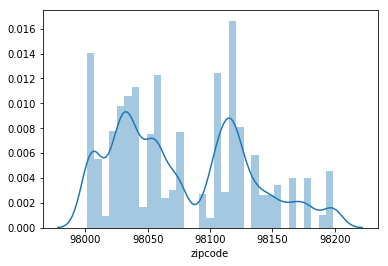

In [54]:
# Verifying the distribution of the variable

sns.distplot(house_df_new['zipcode'])
plt.show()

### Inference of distribution

There are multiple peaks indicating clusters present in the data. Almost all zipcodes have multiple entries, indicating multiple house properties in a given area. 

In [55]:
# Plotting boxplot to detect outliers

data=[(go.Box(x=house_df_new['zipcode'],name='zipcode',showlegend=True))]
plotly.offline.iplot(data)

### Inference of outliers

There are no outliers present in the dataset.

In [56]:
#evaluating the unique entries in the variable list

house_df_new['zipcode'].sort_values().unique()

array([98001, 98002, 98003, 98004, 98005, 98006, 98007, 98008, 98010,
       98011, 98014, 98019, 98022, 98023, 98024, 98027, 98028, 98029,
       98030, 98031, 98032, 98033, 98034, 98038, 98039, 98040, 98042,
       98045, 98052, 98053, 98055, 98056, 98058, 98059, 98065, 98070,
       98072, 98074, 98075, 98077, 98092, 98102, 98103, 98105, 98106,
       98107, 98108, 98109, 98112, 98115, 98116, 98117, 98118, 98119,
       98122, 98125, 98126, 98133, 98136, 98144, 98146, 98148, 98155,
       98166, 98168, 98177, 98178, 98188, 98198, 98199], dtype=int64)

In [57]:
house_df_new['zipcode'].sort_values().unique().shape

(70,)

There are 70 unique zipcode entries in the dataset. On looking up the zipcodes, these are located in Seattle, Washington in the USA.

## Variable lat -> Property latitude

In [58]:
#evaluating the unique entries in the variable list

house_df_new['lat'].sort_values().unique()

array([47.1559, 47.1593, 47.1622, ..., 47.7774, 47.7775, 47.7776])

In [59]:
house_df_new['lat'].sort_values().unique().shape

(5034,)

There are 5034 unique latitude entries in the dataset. 

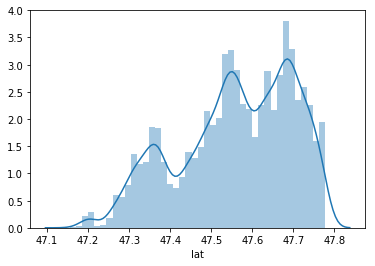

In [60]:
# Verifying the distribution of the variable

sns.distplot(house_df_new['lat'])
plt.show()

### Inference of distribution

There are three distinct peaks indicating 3 prominent latitude clusters present in the data. 

In [61]:
# Plotting boxplot to detect outliers

data=[(go.Box(x=house_df_new['lat'],name='lat',showlegend=True))]
plotly.offline.iplot(data)

### Inference of suspected outliers

As per boxplot, latitudes < 47.1622 are outliers. And thus there are two outliers present in the dataset. Let's us look in conjection with longitude details to check if they are truly outliers.

## Suspected Outlier Verification - Latitude

In [62]:
# printing all rows with suspected outliers in Latitude and checking against longitude and zipcode

house_df_new[house_df_new.lat<47.1622][['lat','long','zipcode']]

,lat,long,zipcode
2815,47.1559,-121.646,98022
8186,47.1593,-121.957,98022


### Outlier Conclusion

The suspected latitude coordinates were verified along with the respective longitudes and were matching to the zipcode provided. Hence, they are not cases of mis-entry and thus these data points would be retained in the dataset.

#### Online verification of co-ordinates

https://www.melissa.com/v2/lookups/latlngzip4/index?lat=47.1559&lng=-121.646

https://www.melissa.com/v2/lookups/latlngzip4/index?lat=47.1593&lng=-121.957

## Variable long -> Property longitude

In [63]:
#evaluating the unique entries in the variable list

house_df_new['long'].sort_values().unique()

array([-122.519, -122.515, -122.514, -122.512, -122.511, -122.509,
       -122.507, -122.506, -122.505, -122.504, -122.503, -122.502,
       -122.499, -122.497, -122.496, -122.491, -122.49 , -122.486,
       -122.484, -122.482, -122.479, -122.475, -122.474, -122.473,
       -122.472, -122.47 , -122.469, -122.467, -122.465, -122.464,
       -122.463, -122.462, -122.461, -122.46 , -122.459, -122.458,
       -122.457, -122.456, -122.455, -122.454, -122.453, -122.452,
       -122.451, -122.45 , -122.449, -122.448, -122.447, -122.446,
       -122.445, -122.444, -122.443, -122.441, -122.44 , -122.439,
       -122.438, -122.435, -122.433, -122.432, -122.431, -122.43 ,
       -122.425, -122.422, -122.421, -122.42 , -122.416, -122.415,
       -122.414, -122.413, -122.412, -122.411, -122.41 , -122.409,
       -122.408, -122.407, -122.406, -122.405, -122.404, -122.403,
       -122.402, -122.401, -122.4  , -122.399, -122.398, -122.397,
       -122.396, -122.395, -122.394, -122.393, -122.392, -122.

In [64]:
house_df_new['long'].sort_values().unique().shape

(752,)

There are 752 unique longitude entries in the dataset. 

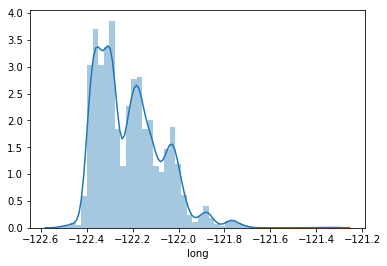

In [65]:
# Verifying the distribution of the variable

sns.distplot(house_df_new['long'])
plt.show()

### Inference of distribution

There are five distinct peaks indicating 5 prominent longitude clusters present in the data. 

In [66]:
# Plotting boxplot to detect outliers

data=[(go.Box(x=house_df_new['long'],name='long',showlegend=True))]
plotly.offline.iplot(data)

### Inference of suspected outliers

As per boxplot, all values greater that -121.821 are marked as outliers. Let's evaluate them along with latitude to check if they are truly outliers.

## Suspected Outlier Verification - Latitude

In [67]:
# printing all rows with suspected outliers in Latitude and checking against longitude and zipcode

house_df_new[house_df_new.long>-121.821][['lat','long','zipcode']].shape

(256, 3)

There are a total of 256 suspected outliers in longitude

In [68]:
# verifying unique pincodes of the suspected longitude outliers

house_df_long=house_df_new[house_df_new.long>-121.821][['lat','long','zipcode']]
house_df_long['zipcode'].unique()

array([98045, 98019, 98065, 98014, 98022], dtype=int64)

### Evaluating one such coordinate in the uszipcode database to check the correctness of the longitude

ID: 21514 Lat: 47.4834 Long: -121.773 Zipcode: 98045

In [69]:
#!pip install uszipcode  #to install the uszipcode package

In [70]:
from uszipcode import SearchEngine 
search = SearchEngine(simple_zipcode=True) #import only simple_zipcode package (9mb)

ModuleNotFoundError: No module named 'uszipcode'

In [ ]:
res=search.by_coordinates(47.4834,-121.773,radius=10,returns=0)
for i in range(len(res)):
    print(res[i].zipcode)

### Outlier inference

For this lat and long, the zipcode in the US database is not matching with the entries in our house database. Also, as the number of suspected outliers is small, we'll remove them from the analysis dataframe.


## Variable living_measure15 -> If living measure is renovated

In [ ]:
# Verifying the distribution of the variable

sns.distplot(house_df_new['living_measure15'])
plt.show()

### Inference of distribution

The data has a normal distribution with only one peak. The distribution is slightly right skewed, indicating a possibility of outliers.

In [ ]:
# Plotting boxplot to detect outliers

data=[(go.Box(x=house_df_new['living_measure15'],name='Living measure renovated in 2015',showlegend=True))]
plotly.offline.iplot(data)

### Inference of Suspected outliers

As per boxplot, values > 3660 suggests suspected outliers.

In [ ]:
#evaluating the unique entries in the variable list

house_df_new['zipcode'].sort_values().unique()

In [ ]:
house_df_new['zipcode'].sort_values().unique().shape

There are 70 unique zipcode entries in the dataset. On looking up the zipcodes, these are located in Seattle, Washington in the USA.

# Multivariate Analysis


# 2. Multivariate analysis

Bi-variate analysis between the predictor variables and target column. Comment on your findings in terms of their relationship and degree of relation if any. Presence of leverage points. Visualize the analysis using boxplots and pair plots, histograms or density curves. Select the most appropriate attributes

In [ ]:
sns.pairplot(house_df_new, diag_kind= 'kde')

In [ ]:
house_df_new.plot(kind= 'box', figsize= (20,10))

Outlier treatment is required here

# Corelation analysis

In [ ]:
X=house_scaled_df.drop('price',axis=1)

In [ ]:
X_corr=X.corr()

In [ ]:
fig, ax = plt.subplots(figsize=(20,20))   
sns.heatmap(X_corr,annot=True)

## Inference

Iot_measure and total_area are very strongly corelated. Likewise ceiling measure and living measure are highly corelated. As there are strong positive corelations between some of the input variables, we can do a PCA to reduce the dimensions

In [ ]:
# Normalizing the dataframe to evaluate the spread across the elements in a similar fashion

from scipy.stats import zscore

house_scaled_df = house_df_new.apply(zscore)

#convert the numpy array back into a dataframe 

house_scaled_df = pd.DataFrame(house_scaled_df, columns=house_df_new.columns)

#Evaluating the scaled dataframe

house_scaled_df.describe().transpose()

In [ ]:
X.head(5)

In [ ]:
from sklearn.decomposition import PCA

In [ ]:
pca=PCA(0.95)

In [ ]:
X_pca=pca.fit_transform(X)

In [ ]:
pca.n_components_

In [ ]:
pca.explained_variance_ratio_

To explain a variance of 95% in the dataframe, PCA is employed to transform the base dataset into one with 15 features. 

In [ ]:
house_df_pca=pd.DataFrame(data=X_pca,columns=['PC1','PC2','PC3','PC4','PC5','PC6','PC7','PC8','PC9','PC10','PC11','PC12','PC13','PC14','PC15'])

In [ ]:
house_df_pca.shape

In [ ]:
house_df_pca.describe()

# k means clustering

In [ ]:
attributes = house_scaled_df.drop('price',axis=1)

#Finding optimal no. of clusters
from scipy.spatial.distance import cdist
from sklearn.cluster import KMeans
clusters=range(1,20)
meanDistortions=[]

for k in clusters:
    model=KMeans(n_clusters=k)
    model.fit(attributes)
    prediction=model.predict(attributes)
    meanDistortions.append(sum(np.min(cdist(attributes, model.cluster_centers_, 'euclidean'), axis=1)) / attributes.shape[0])


plt.plot(clusters, meanDistortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Average distortion')
plt.title('Selecting k with the Elbow Method')


In [ ]:
#  K = 4
final_model=KMeans(4)
final_model.fit(attributes)
prediction=final_model.predict(attributes)

#Append the prediction 
house_scaled_df["GROUP"] = prediction
print("Groups Assigned : \n")
house_scaled_df[["price", "GROUP"]].head(5)

In [ ]:
sns.pairplot(house_scaled_df,hue='GROUP',size=4)

In [ ]:
house_scaled_df.groupby(by='GROUP',axis=0).count()

The group 0 and 2 contain similar number of samples, however, in group 3 there is very low number of samples.

There are total 21613 entities. Hence, let's upsample and downsample among the 4 groups to a mean sample size of 5404 samples each.

In [ ]:
conda install -c glemaitre imbalanced-learn

In [ ]:
from imblearn.over_sampling import SMOTE